# Visualisasi Kasus Positif Covid-19 Jawa Barat

### Pada *notebook* ini, akan dilakukan visualisasi data kasus positif yang terjadi di Jawa Barat. Data yang digunakan menggunakan API yang berasal dari https://covid19-public.digitalservice.id/ 

In [1]:
# to handle  data retrieval
import urllib3
from urllib3 import request
# to handle certificate verification
import certifi
# to manage json data
import json
# for pandas dataframes
import pandas as pd
# uncomment below if installation needed (not necessary in Colab)
!pip install certifi

In [2]:
# handle certificate verification and SSL warnings
# https://urllib3.readthedocs.io/en/latest/user-guide.html#ssl
http = urllib3.PoolManager(
       cert_reqs='CERT_REQUIRED',
       ca_certs=certifi.where())

## Mengakses API

In [3]:
# get data from the API
url = 'https://covid19-public.digitalservice.id/api/v1/sebaran_v2/jabar'
r = http.request('GET', url)
r.status

200

## Data JSON 

In [4]:
# decode json data into a dict object
data = json.loads(r.data.decode('utf-8'))
data

{'status_code': 200,
 'data': {'metadata': {'last_update': '2021-07-06, 04:27:13'},
  'content': [{'id': 'from_manual_341890',
    'kode_kab': '3276',
    'nama_kab': 'Kota Depok',
    'kode_kec': '3276021',
    'nama_kec': 'Cipayung',
    'kode_kel': '3276021005',
    'nama_kel': 'Cipayung',
    'status': 'CONFIRMATION',
    'stage': 'Diisolasi',
    'umur': 8.0,
    'gender': 'Laki-laki',
    'longitude': 106.795,
    'latitude': -6.421,
    'tanggal_konfirmasi': '2021-06-17',
    'tanggal_update': '2021-06-17',
    'current_location_type': 'Dinkes Prov. Jabar',
    'current_location_district_code': None,
    'current_location_subdistrict_code': None,
    'current_location_village_code': None,
    'current_location_address': None,
    'report_source': None,
    'tanggal_update_nasional': '2021-06-19'},
   {'id': 'from_manual_342209',
    'kode_kab': '3276',
    'nama_kab': 'Kota Depok',
    'kode_kec': '3276021',
    'nama_kec': 'Cipayung',
    'kode_kel': '3276021005',
    'nama_kel

## Dataset dari data JSON

In [5]:
# in this dataset, the data to extract is under 'data/content'
df = pd.json_normalize(data, record_path=['data','content'])
df.head(10)

,id,kode_kab,nama_kab,kode_kec,nama_kec,kode_kel,nama_kel,status,stage,umur,...,latitude,tanggal_konfirmasi,tanggal_update,current_location_type,current_location_district_code,current_location_subdistrict_code,current_location_village_code,current_location_address,report_source,tanggal_update_nasional
0,from_manual_341890,3276,Kota Depok,3276021,Cipayung,3276021005,Cipayung,CONFIRMATION,Diisolasi,8.0,...,-6.421,2021-06-17,2021-06-17,Dinkes Prov. Jabar,None,None,None,None,None,2021-06-19
1,from_manual_342209,3276,Kota Depok,3276021,Cipayung,3276021005,Cipayung,CONFIRMATION,Diisolasi,26.0,...,-6.421,2021-06-16,2021-06-16,Dinkes Prov. Jabar,None,None,None,None,None,2021-06-19
2,from_manual_345849,3276,Kota Depok,3276021,Cipayung,3276021002,Bojong Pondok Terong,CONFIRMATION,Diisolasi,44.0,...,-6.437,2021-06-20,2021-06-20,Dinkes Prov. Jabar,None,None,None,None,None,2021-06-21
3,from_manual_342033,3205,Kabupaten Garut,3205190,Garut Kota,3205190009,Ciwalen,CONFIRMATION,Diisolasi,68.0,...,-7.215,2021-05-28,2021-05-28,Rumah Sakit Umum Syifa Medina,None,None,None,None,None,2021-06-19
4,from_manual_342486,3276,Kota Depok,3276021,Cipayung,3276021005,Cipayung,CONFIRMATION,Diisolasi,51.0,...,-6.421,2021-04-28,2021-04-28,Rumah Sakit Umum Meilia,None,None,None,None,None,2021-06-19
5,from_manual_348139,3205,Kabupaten Garut,3205190,Garut Kota,3205190009,Ciwalen,CONFIRMATION,Diisolasi,24.0,...,-7.215,2021-06-20,2021-06-20,Ciputra Hospital Citra Raya,None,None,None,None,None,2021-06-22
6,from_manual_351957,3205,Kabupaten Garut,3205190,Garut Kota,3205190009,Ciwalen,CONFIRMATION,Diisolasi,60.0,...,-7.215,2021-06-15,2021-06-15,Rumah Sakit Umum Tk IV Guntur,None,None,None,None,None,2021-06-23
7,from_manual_354926,3205,Kabupaten Garut,3205190,Garut Kota,3205190009,Ciwalen,CONFIRMATION,Diisolasi,34.0,...,-7.215,2021-06-20,2021-06-20,Rumah Sakit Khusus Ibu dan Anak Kota Bandung,None,None,None,None,None,2021-06-24
8,from_manual_355355,3205,Kabupaten Garut,3205190,Garut Kota,3205190009,Ciwalen,CONFIRMATION,Diisolasi,62.0,...,-7.215,2021-05-28,2021-05-28,Rumah Sakit Umum Syifa Medina,None,None,None,None,None,2021-06-24
9,from_manual_362146,3205,Kabupaten Garut,3205190,Garut Kota,3205190009,Ciwalen,CONFIRMATION,Diisolasi,83.0,...,-7.215,2021-06-15,2021-06-15,Rumah Sakit Umum Al-Islam Bandung,None,None,None,None,None,2021-06-26


## Data Analysis dan Data Cleaning

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 772702 entries, 0 to 772701
Data columns (total 22 columns):
 #   Column                             Non-Null Count   Dtype  
---  ------                             --------------   -----  
 0   id                                 772702 non-null  object 
 1   kode_kab                           772702 non-null  object 
 2   nama_kab                           772702 non-null  object 
 3   kode_kec                           772702 non-null  object 
 4   nama_kec                           772702 non-null  object 
 5   kode_kel                           772702 non-null  object 
 6   nama_kel                           772702 non-null  object 
 7   status                             772702 non-null  object 
 8   stage                              772701 non-null  object 
 9   umur                               762641 non-null  float64
 10  gender                             765366 non-null  object 
 11  longitude                          4002

In [7]:
df.describe()

,umur,longitude,latitude
count,762641.000000,400240.000000,400240.000000
mean,34.802924,107.389910,-6.628045
std,24.679429,0.577381,0.354365
min,-948.750000,106.405000,-7.809000
25%,21.250000,106.874000,-6.909000
50%,34.000000,107.180000,-6.532000
75%,48.500000,107.723000,-6.338000
max,2021.000000,108.821000,-5.977000


In [8]:
df2 = df.copy() #df yang diolah

In [9]:
df2.drop(df2[df2.umur<0].index,inplace=True)

In [10]:
df2.nama_kab.unique()

array(['Kota Depok', 'Kabupaten Garut', 'Kabupaten Bekasi',
       'Kabupaten Bandung', 'Kota Bandung', 'Kota Tasikmalaya',
       'Kabupaten Purwakarta', 'Kabupaten Sumedang', 'Kota Bogor',
       'Kota Cirebon', 'Kabupaten Subang', 'Kota Banjar', 'Kota Cimahi',
       'Kabupaten Bogor', 'Kabupaten Majalengka', 'Kabupaten Sukabumi',
       'Kabupaten Kuningan', 'Kabupaten Tasikmalaya', 'Kota Sukabumi',
       'Kabupaten Cirebon', 'Kabupaten Indramayu', 'Kota Bekasi',
       'Kabupaten Pangandaran', 'Kabupaten Cianjur', 'Kabupaten Karawang',
       'Kabupaten Ciamis', 'Kabupaten Bandung Barat', 'Jawa Barat',
       'KAB. BOGOR', 'KAB. CIAMIS', 'KAB. CIREBON', 'KAB. BANDUNG BARAT',
       'KOTA BEKASI', 'KAB. CIANJUR', 'KAB. GARUT', 'KOTA CIMAHI',
       'KAB. SUKABUMI', 'KOTA SUKABUMI', 'KOTA BANJAR', 'KAB. KARAWANG',
       'KAB. KUNINGAN', 'KAB. BEKASI', 'KAB. PANGANDARAN',
       'KOTA TASIKMALAYA', 'KAB. BANDUNG', 'KOTA BANDUNG',
       'KAB. INDRAMAYU', 'KOTA DEPOK', 'KAB. PURWAKA

In [11]:
(df2[df2.nama_kab=="Jawa Barat"].groupby('stage').count())['id']

stage
Diisolasi       1
Meninggal       9
Selesai      2155
Name: id, dtype: int64

In [12]:
df2.drop(df2[df2.nama_kab=="Jawa Barat"].index, axis=0, inplace=True)

In [13]:
(df2[df2.nama_kab=="CITEUREUP KOTA CIMAHI"].groupby('stage').count())['id']

stage
Dikarantina     3
Discarded      78
Name: id, dtype: int64

In [14]:
df2.drop(df2[df2.nama_kab=="CITEUREUP KOTA CIMAHI"].index, axis=0, inplace=True)

In [15]:
import re

def split_KAB(text):
    x = re.findall('^KAB\. ([a-zA-Z]+$)', text)
    if x :
        return('Kabupaten'+' '+x[0].capitalize())
    else:
        return(text)

def split_KOT(text):
    x = re.findall('^KOTA ([a-zA-Z]+$)', text)
    if x :
        return('Kota'+' '+x[0].capitalize())
    else:
        return(text)

In [16]:
df2.nama_kab = df2.nama_kab.apply(split_KAB)

In [17]:
df2.nama_kab = df2.nama_kab.apply(split_KOT)

In [18]:
df2 = df2.replace('KAB. BANDUNG BARAT', 'Kabupaten Bandung Barat')

In [19]:
df2.drop(df2[(df2.stage=='Selesai')|(df2.stage=='Meninggal')|(df2.stage=='Discarded')|(df2.stage=='Negatif')].index,axis=0,inplace=True)

In [20]:
df3 = df2[['nama_kab','status','stage','umur','longitude','latitude','gender']]

In [21]:
df3.reset_index(inplace=True)

In [22]:
df3.drop('index', axis=1, inplace=True)

C:\Users\user\anaconda3\lib\site-packages\pandas\core\frame.py:3997: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,


In [23]:
df3['tick']=1

C:\Users\user\anaconda3\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [24]:
df3.head()

,nama_kab,status,stage,umur,longitude,latitude,gender,tick
0,Kota Depok,CONFIRMATION,Diisolasi,8.0,106.795,-6.421,Laki-laki,1
1,Kota Depok,CONFIRMATION,Diisolasi,26.0,106.795,-6.421,Perempuan,1
2,Kota Depok,CONFIRMATION,Diisolasi,44.0,106.803,-6.437,Laki-laki,1
3,Kabupaten Garut,CONFIRMATION,Diisolasi,68.0,107.909,-7.215,Laki-laki,1
4,Kota Depok,CONFIRMATION,Diisolasi,51.0,106.795,-6.421,Perempuan,1


In [25]:
gb3 = df3.groupby(['nama_kab','status']).count()['tick']

In [26]:
dfgb3 = pd.DataFrame(gb3)
dfgb3 = dfgb3.reset_index()

In [27]:
dfgb3.columns = ['nama_kab', 'status', 'jumlah']

## Pengolahan Data Peta

In [28]:
import geopandas as gpd

In [29]:
map = gpd.read_file("D:\Job\jabardigital\gadm36_IDN_gpkg\gadm36_IDN.gpkg",layer=3)

In [30]:
jabarmap = map[map.NAME_1=="Jawa Barat"]

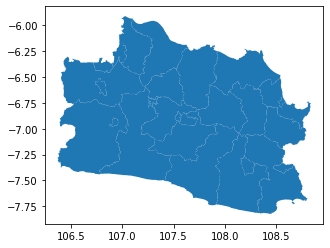

In [31]:
jabarmap.plot()

In [32]:
jabarmap["nama_kab"] = jabarmap.TYPE_2+" "+jabarmap.NAME_2

C:\Users\user\anaconda3\lib\site-packages\geopandas\geodataframe.py:1322: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super(GeoDataFrame, self).__setitem__(key, value)


In [33]:
def split_KOTA2(text):
    x = re.findall('^Kota (Kota [a-zA-Z]+$)', text)
    if x :
        return(x[0])
    else:
        return(text)

In [34]:
jabarmap.nama_kab = jabarmap.nama_kab.apply(split_KOTA2)

In [35]:
jabarmap = jabarmap.replace('Water Body Waduk Cirata', 'Waduk Cirata')

In [36]:
jabarmap2 = jabarmap[['nama_kab', 'geometry']]

In [37]:
jabarmap2.reset_index(inplace=True)

In [38]:
jabarmap2.drop('index', axis=1, inplace=True)

C:\Users\user\anaconda3\lib\site-packages\pandas\core\frame.py:3997: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,


In [39]:
jabarmap2

,nama_kab,geometry
0,Kabupaten Bandung,"MULTIPOLYGON (((107.91476 -7.03680, 107.91488 ..."
1,Kabupaten Bandung Barat,"MULTIPOLYGON (((107.18784 -7.06032, 107.18757 ..."
2,Kota Banjar,"MULTIPOLYGON (((108.63680 -7.38144, 108.63651 ..."
3,Kabupaten Bekasi,"MULTIPOLYGON (((107.08303 -6.44980, 107.08250 ..."
4,Kabupaten Bogor,"MULTIPOLYGON (((107.19311 -6.57829, 107.19368 ..."
5,Kabupaten Ciamis,"MULTIPOLYGON (((108.77411 -7.68451, 108.77433 ..."
6,Kabupaten Cianjur,"MULTIPOLYGON (((106.98129 -7.44455, 106.97968 ..."
7,Kota Cimahi,"MULTIPOLYGON (((107.56550 -6.87602, 107.56554 ..."
8,Kabupaten Cirebon,"MULTIPOLYGON (((108.46553 -6.79754, 108.46519 ..."
9,Kota Depok,"MULTIPOLYGON (((106.83224 -6.45344, 106.83221 ..."


## Penggabungan Data Kasus Positif dan Data Peta

In [40]:
gabungan = pd.merge(left=dfgb3, right=jabarmap2, how='right', left_on='nama_kab', right_on='nama_kab')

In [51]:
gabungan.head()

,nama_kab,status,jumlah,geometry
0,Kabupaten Bandung,CLOSECONTACT,4411.0,"MULTIPOLYGON (((107.91476 -7.03680, 107.91488 ..."
1,Kabupaten Bandung,CONFIRMATION,4073.0,"MULTIPOLYGON (((107.91476 -7.03680, 107.91488 ..."
2,Kabupaten Bandung,PROBABLE,4.0,"MULTIPOLYGON (((107.91476 -7.03680, 107.91488 ..."
3,Kabupaten Bandung,SUSPECT,782.0,"MULTIPOLYGON (((107.91476 -7.03680, 107.91488 ..."
4,Kabupaten Bandung Barat,CLOSECONTACT,2475.0,"MULTIPOLYGON (((107.18784 -7.06032, 107.18757 ..."


In [42]:
gabunganGDF = gpd.GeoDataFrame(gabungan)

In [43]:
gabunganconf = gabunganGDF[gabunganGDF['status']=='CONFIRMATION']

In [44]:
gabunganconf['label']=gabunganconf.geometry.representative_point()

C:\Users\user\anaconda3\lib\site-packages\geopandas\geodataframe.py:1322: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super(GeoDataFrame, self).__setitem__(key, value)


## Visualisasi Berdasarkan Kasus per Daerah

Text(0.5, 0, 'Nama Daerah')

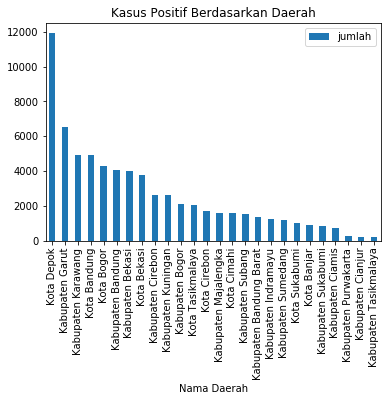

In [115]:
import matplotlib.pyplot as plt

pd.DataFrame(gabunganconf).sort_values('jumlah',axis=0,ascending=False).plot(x='nama_kab', y='jumlah', kind='bar')
plt.title('Kasus Positif Berdasarkan Daerah')
plt.xlabel('Nama Daerah')

Text(334.86963242719565, 0.5, 'Latitude')

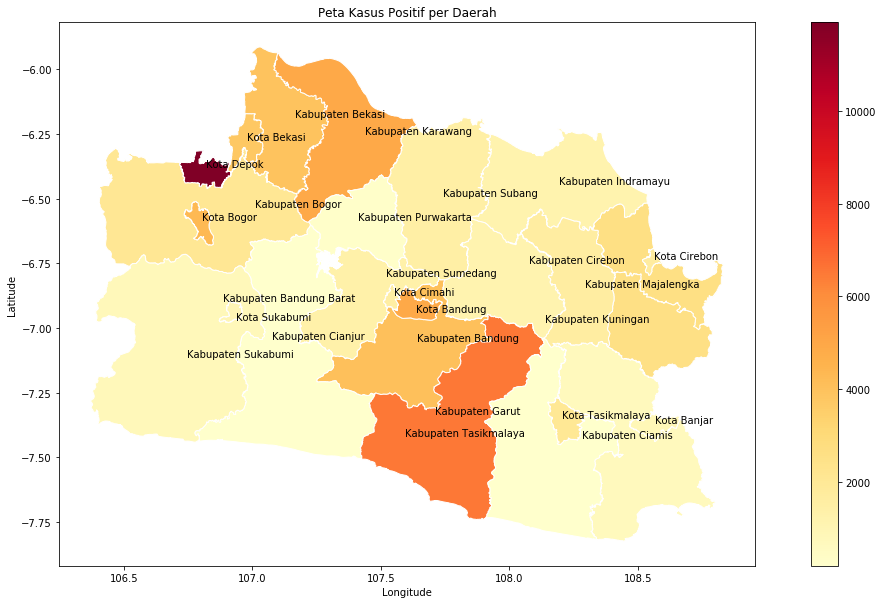

In [118]:
petacovid1 = gabunganconf.plot(column='jumlah', figsize=(20,10), cmap='YlOrRd', edgecolor='white', legend=True)

from adjustText import adjust_text

labelpeta=[]

for namakota,posisi in zip(gabunganconf['nama_kab'],gabunganconf['label']):
    labelpeta.append(petacovid1.text(posisi.x, posisi.y, namakota, fontsize=10, color='black'))

adjust_text(labelpeta)

plt.title('Peta Kasus Positif per Daerah')
plt.xlabel('Longitude')
plt.ylabel('Latitude')

In [46]:
import folium
from folium import plugins

petacovid2 = folium.Map(location = [-6.872458536127907, 107.6760448229915], tiles='OpenStreetMap', zoom_start = 8.48)

folium.GeoJson(data=jabarmap2["geometry"]).add_to(petacovid2)

dfconf = df3[df3.status=='CONFIRMATION']

heat=[]
for x,y in zip(dfconf.latitude,dfconf.longitude):
    heat.append((x,y))

plugins.HeatMap(heat).add_to(petacovid2)

In [47]:
def add_markers_to_the_map(the_map, gdf, color, icon):  
    points = list(zip(gdf.koord, gdf.nama_kab, gdf.jumlah))
    for point in points:         
            popup_text = "{}, {}".format(point[1], str(point[2]))
        
            popup = folium.Popup(popup_text, autopan='False', parse_html=True)
                
            marker = folium.Marker(location=[point[0][1], point[0][0]], 
                                   popup=popup, 
                                   icon = folium.Icon(icon_size=(25, 25), color=color, icon=icon, prefix='fa')).add_to(the_map)
    return the_map

In [49]:
def ambilkordinat(text):
    x = re.findall('^POINT \(([0-9]*\.[0-9]+) ([+-]?(?=\.\d|\d)(?:\d+)?(?:\.?\d*))(?:[eE]([+-]?\d+))?\)$', str(text))
    if x :
        return((x[0][0]),(x[0][1]))
    else:
        return(text)

gabunganconf['koord'] = gabunganconf.label.apply(ambilkordinat)

C:\Users\user\anaconda3\lib\site-packages\geopandas\geodataframe.py:1322: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super(GeoDataFrame, self).__setitem__(key, value)


## Visualisasi Berdasarkan Kepadatan Kasus Positif 

In [50]:
add_markers_to_the_map(petacovid2, gabunganconf, color='red', icon='asterisk')

## Perbandingan Berdasarkan Jenis Kelamin

Text(0.5, 1.0, 'Kasus Positif Berdasarkan Jenis Kelamin')

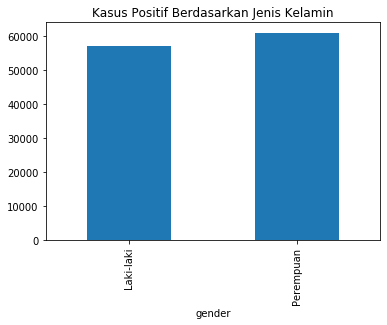

In [69]:
df3.groupby("gender").count()['tick'].plot(kind='bar')
plt.title("Kasus Positif Berdasarkan Jenis Kelamin")

## Perbandingan Berdasarkan Umur

Text(0.5, 1.0, 'Kasus Positif Berdasarkan Umur')

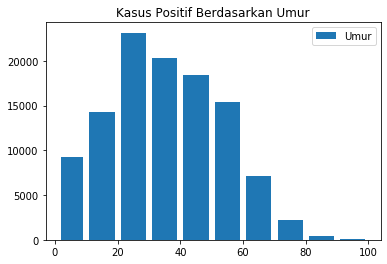

In [119]:
plt.hist(df3.umur, bins=[1,10,20,30,40,50,60,70,80,90,100], rwidth=0.8, label='Umur')
plt.legend()
plt.title('Kasus Positif Berdasarkan Umur')